# Extraemos todos los archivos de los zip

In [1]:
from zipfile import ZipFile

import os
import pandas as pd
import numpy as np

import json

import folium
import folium.plugins
from folium.plugins import HeatMapWithTime as HMWT
from folium.plugins import HeatMap as HM
from folium.plugins import MarkerCluster

!pip install utils
!pip install xmltojson
import requests as req
import xmltojson


from bs4 import BeautifulSoup as bs
#!pip install python-vlc

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import chart_studio.plotly as py
import cufflinks as cf
cf.go_offline()

from ipywidgets import interact

from wordcloud import WordCloud

Defaulting to user installation because normal site-packages is not writeable
Defaulting to user installation because normal site-packages is not writeable


In [2]:
archivos = os.listdir()
archivos

['.git',
 'takeout-20210614T071504Z-001.zip',
 'mando.png',
 'takeout-20210614T071504Z-002.zip',
 'takeout-20210614T071504Z-004.zip',
 'takeout-20210614T071504Z-005.zip',
 'Esquema.docx',
 'README.md',
 'takeout-20210614T071504Z-003.zip',
 '.~lock.Esquema.docx#',
 'Takeout',
 '.ipynb_checkpoints',
 'ProyectoFinal.ipynb',
 '.gitignore']

In [3]:
archivos_zip = []
for i in archivos:
    if i.endswith(".zip"):
        archivos_zip.append(i)

In [4]:
archivos_zip
    

['takeout-20210614T071504Z-001.zip',
 'takeout-20210614T071504Z-002.zip',
 'takeout-20210614T071504Z-004.zip',
 'takeout-20210614T071504Z-005.zip',
 'takeout-20210614T071504Z-003.zip']

In [5]:
cwd = os.getcwd()

In [6]:
'''for i in archivos_zip:
    zf = ZipFile(i)
    zf.extractall()'''

'for i in archivos_zip:\n    zf = ZipFile(i)\n    zf.extractall()'

In [7]:
os.chdir(cwd + '/' + 'Takeout')

In [8]:
Takeout_dir = os.getcwd()

In [9]:
Takeout_dir

'/home/jbloch3/Documents/Proyecto_Final/Takeout'

In [10]:
os.listdir()

['Google Fotos',
 'Chrome',
 'Search Contributions',
 'Google\xa0Pay',
 'Tareas',
 'Correo',
 'Cloud Print',
 'Save',
 'Google Shopping',
 'Drive',
 'Keep',
 'Hangouts',
 'Servicio de configuración de dispositivo Android',
 'Classroom',
 'archive_browser.html',
 'Grupos',
 'Google Play Libros',
 'Blogger',
 'Google\xa0My\xa0Business',
 'wordcloud.png',
 'Historial de ubicaciones',
 'Mi actividad',
 'Calendar',
 'Cuenta de Google',
 'Perfil',
 'Google Workspace Marketplace',
 'Contactos',
 'YouTube y YouTube Music',
 'Noticias',
 'Servicios de Juegos de Google Play',
 'Google Play Store',
 'Google Play Películas',
 'Maps',
 'Aplicación Home',
 'Maps (Tus sitios)']

In [11]:
#perfil_df = pd.json_normalize("Takeout_dir + '/' + 'Perfil' +'/'+'Perfil.json'")

f = open(Takeout_dir + '/' + 'Perfil' +'/'+'Perfil.json')

In [12]:
perfil_json = json.load(f)

In [13]:
nombre = perfil_json['name']['formattedName']
nombre

'Jaime Bloch'

In [14]:
perfil_json

{'name': {'givenName': 'Jaime',
  'familyName': 'Bloch',
  'formattedName': 'Jaime Bloch'},
 'displayName': 'Jaime Bloch',
 'emails': [{'value': 'jaimebloch3@gmail.com'}],
 'gender': {'type': 'male'}}

In [15]:
email = perfil_json['emails'][0]['value']

In [16]:
c = open(Takeout_dir + '/' + 'Chrome' +'/'+'BrowserHistory.json')

In [17]:
chrome_json = json.load(c)

In [18]:
df = pd.DataFrame(chrome_json['Browser History'])

In [19]:
df.url.tail


<bound method NDFrame.tail of 0       https://support.google.com/android/answer/2819582
1         https://support.google.com/drive/answer/2424368
2       https://support.google.com/android/answer/2819582
3       https://support.google.com/android/answer/6193...
4       https://www.backmarket.es/samsung-galaxy-s6-32...
                              ...                        
5518    https://as.com/futbol/2020/06/13/primera/15920...
5519    https://as.com/futbol/2020/06/14/primera/15921...
5520                                      https://as.com/
5521    https://m.eldiario.es/politica/construccion-me...
5522                               https://m.eldiario.es/
Name: url, Length: 5523, dtype: object>

In [20]:
for i in range(len(df.url)):
    if '//' in df.url[i]:
        df.url[i] = df.url[i].split('//')[1]
        


In [21]:
for i in range(len(df.url)):
    if '/' in df.url[i]:
        df.url[i] = df.url[i].split('/')[0]

In [22]:
set(df.url)

{'9gag.com',
 'about:blank',
 'accounts.google.com',
 'accounts2.tplinkcloud.com',
 'aenfismadridpenagrande.com',
 'altadex.com',
 'ammos.es',
 'amp-20minutos-es.cdn.ampproject.org',
 'amp-cinemablend-com.cdn.ampproject.org',
 'amp-diariogol-com.cdn.ampproject.org',
 'amp-economiadigital-es.cdn.ampproject.org',
 'amp-elmundo-es.cdn.ampproject.org',
 'amp-elperiodico-com.cdn.ampproject.org',
 'amp-europapress-es.cdn.ampproject.org',
 'amp-heraldo-es.cdn.ampproject.org',
 'amp-jsonline-com.cdn.ampproject.org',
 'amp-laopiniondemalaga-es.cdn.ampproject.org',
 'amp-lasexta-com.cdn.ampproject.org',
 'amp-lne-es.cdn.ampproject.org',
 'amp-marca-com.cdn.ampproject.org',
 'amp-milenio-com.cdn.ampproject.org',
 'amp-reddit-com.cdn.ampproject.org',
 'amp-rtve-es.cdn.ampproject.org',
 'amp-ultimahora-es.cdn.ampproject.org',
 'amp.20minutos.es',
 'andro4all-com.cdn.ampproject.org',
 'android-upd.xyz',
 'anewspost.com',
 'answers.ea.com',
 'answers.microsoft.com',
 'apnews.com',
 'ar.pinterest.com'

In [23]:
df.groupby('url').count().sort_values('title', ascending=False)

,page_transition,title,client_id,time_usec
url,,,,
as.com,2189,2189,2189,2189
www.eldiario.es,515,515,515,515
www.google.com,317,317,317,317
mobile.twitter.com,137,137,137,137
www.pinterest.es,109,109,109,109
...,...,...,...,...
www-adslzone-net.cdn.ampproject.org,1,1,1,1
web.movistar.es,1,1,1,1
virgintelco.es,1,1,1,1


In [24]:
Top10URL = df.url.value_counts()[0:10]

In [25]:
Top10URL

as.com                2189
www.eldiario.es        515
www.google.com         317
mobile.twitter.com     137
www.pinterest.es       109
aulavirtual.um.es       91
resultados.as.com       87
www.soolide.com         84
www.xvideos.com         68
es.m.wikipedia.org      53
Name: url, dtype: int64

In [26]:
Top10URL_df = pd.DataFrame(Top10URL)
Top10URL_df 

,url
as.com,2189
www.eldiario.es,515
www.google.com,317
mobile.twitter.com,137
www.pinterest.es,109
aulavirtual.um.es,91
resultados.as.com,87
www.soolide.com,84
www.xvideos.com,68
es.m.wikipedia.org,53


In [27]:
Top10URL_df_i= Top10URL_df.reset_index()
Top10URL_df_i

,index,url
0,as.com,2189
1,www.eldiario.es,515
2,www.google.com,317
3,mobile.twitter.com,137
4,www.pinterest.es,109
5,aulavirtual.um.es,91
6,resultados.as.com,87
7,www.soolide.com,84
8,www.xvideos.com,68
9,es.m.wikipedia.org,53


In [28]:
#Top10URL_df.plot('index', 'url', type)
#plt.hist(Top10URL_df, x= 'index', y= 'url')
Top10URL.iplot(kind='bar', xTitle='Country', title='Páginas más visitadas')

In [29]:
os. chdir('Servicios de Juegos de Google Play/Juegos/')#cd Servicios de Juegos de Google Play/Juegos/

In [30]:
ls

'Best Sniper Legacy_ Dino Hunt'/  'Jet Run_ City Defender'/
'CATS_ Crash Arena Turbo Stars'/  'Linebound - Life On The Line'/
'Cooking Fever'/                  'Madrid Zombi'/
'DEAD TARGET_ Zombie Shooting'/   'Red Ball 4'/
'Google Play Games'/              'Warlings_ Armageddon'/
'Hero Wars'/                       wordcloud.png


In [31]:
juegos = os.listdir()
juegos

['Jet Run_ City Defender',
 'Red Ball 4',
 'Madrid Zombi',
 'DEAD TARGET_ Zombie Shooting',
 'Google Play Games',
 'Linebound - Life On The Line',
 'wordcloud.png',
 'CATS_ Crash Arena Turbo Stars',
 'Warlings_ Armageddon',
 'Hero Wars',
 'Cooking Fever',
 'Best Sniper Legacy_ Dino Hunt']

In [32]:
juegos_df = pd.DataFrame(juegos)
juegos_df
juegos_df['limpio'] = juegos_df.apply(lambda x: x.replace(' ', '_'))
juegos_df['limpio'] = juegos_df['limpio'].apply(lambda x: x.replace(' ', '_'))
juegos_df

,0,limpio
0,Jet Run_ City Defender,Jet_Run__City_Defender
1,Red Ball 4,Red_Ball_4
2,Madrid Zombi,Madrid_Zombi
3,DEAD TARGET_ Zombie Shooting,DEAD_TARGET__Zombie_Shooting
4,Google Play Games,Google_Play_Games
5,Linebound - Life On The Line,Linebound_-_Life_On_The_Line
6,wordcloud.png,wordcloud.png
7,CATS_ Crash Arena Turbo Stars,CATS__Crash_Arena_Turbo_Stars
8,Warlings_ Armageddon,Warlings__Armageddon
9,Hero Wars,Hero_Wars


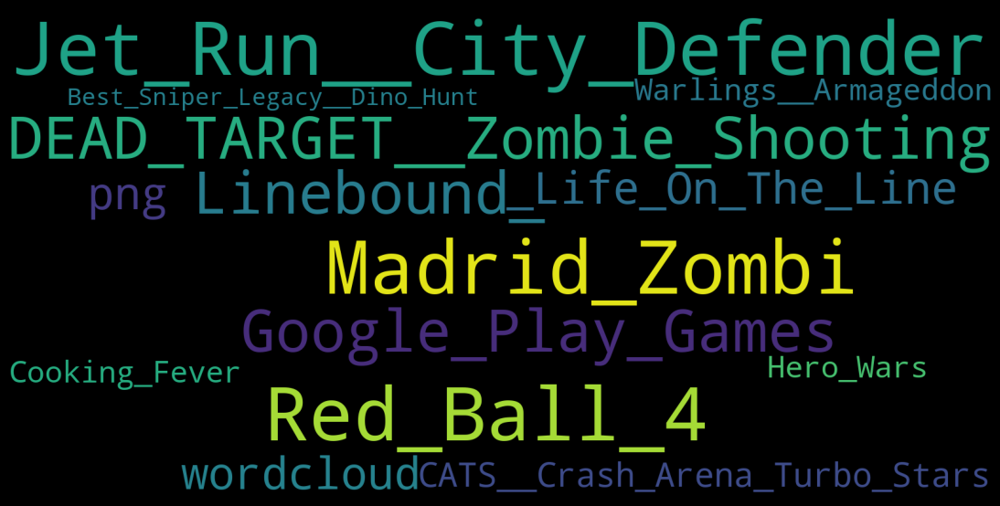

In [33]:
wordcloud = WordCloud(width=1600,height=800, stopwords=juegos, repeat= False, collocations=False).generate(' '.join([e for e in juegos_df['limpio']]))

plt.figure(figsize=(15, 10), facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.savefig('wordcloud.png', facecolor='k', bbox_inches='tight')
plt.show();

In [34]:
df['sopa'] = df.url.apply(lambda x: x.replace('com', '').replace('www', '').replace('es', '')
                           .replace('org', '').strip())

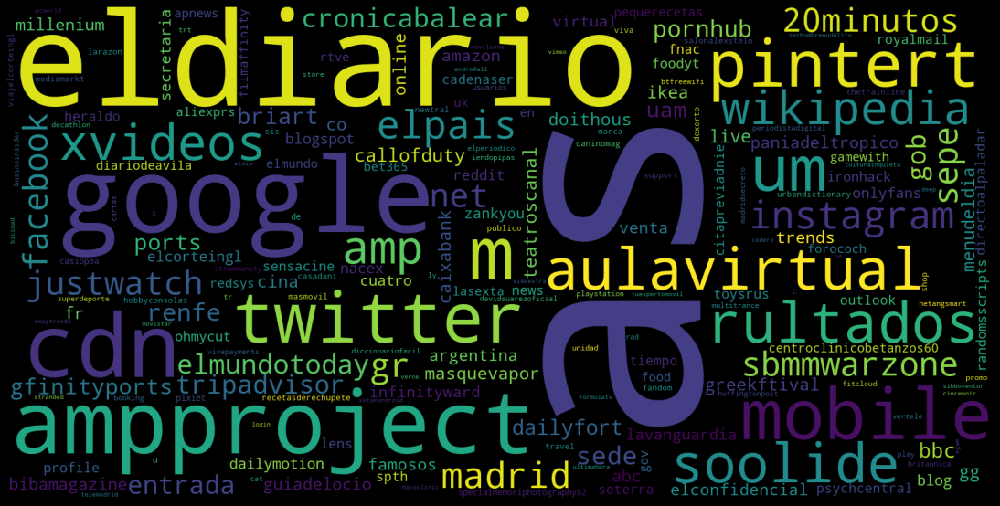

In [35]:
wordcloud = WordCloud(width=1600,height=800, stopwords=juegos, repeat= False, collocations=False).generate(' '.join([e for e in df.sopa]))

plt.figure(figsize=(15, 10), facecolor='k')
plt.imshow(wordcloud)
plt.axis('off')
plt.tight_layout(pad=0)
plt.savefig('wordcloud.png', facecolor='k', bbox_inches='tight')
plt.show();

In [36]:
os. chdir(Takeout_dir)

In [37]:
r = open(Takeout_dir + '/' + 'Maps (Tus sitios)' +'/'+'Reseñas.json')

In [38]:
reseñas_json = json.load(r)

In [39]:
reseñas_json["features"]

[{'geometry': {'coordinates': [-3.6738487, 40.4248464], 'type': 'Point'},
  'properties': {'Google Maps URL': 'https://www.google.com/maps/place//data=!4m2!3m1!1s0x0:0x5d92102d0ed91be8',
   'Location': {'Address': 'Calle de Goya, 99 escalera A, 1D, 28009 Madrid, España',
    'Business Name': 'Instituto Dental Espinassi & Happy Smile Clinic',
    'Country Code': 'ES',
    'Geo Coordinates': {'Latitude': '40.4248464', 'Longitude': '-3.6738487'}},
   'Published': '2021-05-27T14:18:47.943834Z',
   'Review Comment': 'Una experiencia estupenda. El sitio está muy bien, me trataron genial y el tratamiento de blancamiento es super efectivo. Muy recomendable :)',
   'Star Rating': 5},
  'type': 'Feature'},
 {'geometry': {'coordinates': [-3.7040303, 40.426999], 'type': 'Point'},
  'properties': {'Google Maps URL': 'https://www.google.com/maps/place//data=!4m2!3m1!1s0x0:0x78bf2642005218b1',
   'Location': {'Address': 'Plaza del Dos de Mayo, 28004 Madrid, España',
    'Business Name': 'Plaza del Do

In [40]:
df_reseñas = pd.DataFrame(reseñas_json["features"])
df_reseñas

,geometry,properties,type
0,"{'coordinates': [-3.6738487, 40.4248464], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
1,"{'coordinates': [-3.7040303, 40.426999], 'type...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
2,"{'coordinates': [-3.708749, 40.416807], 'type'...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
3,"{'coordinates': [-3.7026066, 40.4313091], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
4,"{'coordinates': [23.728162, 37.9654788], 'type...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
5,"{'coordinates': [-3.59055, 40.4621018], 'type'...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
6,"{'coordinates': [-3.701479, 40.40255], 'type':...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
7,"{'coordinates': [-3.6882448, 40.4257422], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
8,"{'coordinates': [-3.7011585, 40.4294192], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
9,"{'coordinates': [-3.7094052, 40.4205735], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature


In [41]:
df_reseñas1 = pd.json_normalize(df_reseñas['properties'])
df_reseñas1.dtypes

Google Maps URL                       object
Published                             object
Review Comment                        object
Star Rating                            int64
Location.Address                      object
Location.Business Name                object
Location.Country Code                 object
Location.Geo Coordinates.Latitude     object
Location.Geo Coordinates.Longitude    object
dtype: object

In [42]:
df_reseñas1.dtypes

Google Maps URL                       object
Published                             object
Review Comment                        object
Star Rating                            int64
Location.Address                      object
Location.Business Name                object
Location.Country Code                 object
Location.Geo Coordinates.Latitude     object
Location.Geo Coordinates.Longitude    object
dtype: object

In [43]:
df_reseñas1["Location.Geo Coordinates.Latitude"] = pd.to_numeric(df_reseñas1["Location.Geo Coordinates.Latitude"], downcast="float")
df_reseñas1['Location.Geo Coordinates.Longitude'] = pd.to_numeric(df_reseñas1['Location.Geo Coordinates.Longitude'], downcast="float")
df_reseñas1

,Google Maps URL,Published,Review Comment,Star Rating,Location.Address,Location.Business Name,Location.Country Code,Location.Geo Coordinates.Latitude,Location.Geo Coordinates.Longitude
0,https://www.google.com/maps/place//data=!4m2!3...,2021-05-27T14:18:47.943834Z,Una experiencia estupenda. El sitio está muy b...,5,"Calle de Goya, 99 escalera A, 1D, 28009 Madrid...",Instituto Dental Espinassi & Happy Smile Clinic,ES,40.424847,-3.673849
1,https://www.google.com/maps/place//data=!4m2!3...,2021-02-14T12:08:37.717870Z,NaN,5,"Plaza del Dos de Mayo, 28004 Madrid, España",Plaza del Dos de Mayo,ES,40.426998,-3.704030
2,https://www.google.com/maps/place//data=!4m2!3...,2020-12-14T04:10:40.835201Z,NaN,5,"Calle de las Fuentes, 1, 28013 Madrid, España",Ramen Kagura Ópera,ES,40.416805,-3.708749
3,https://www.google.com/maps/place//data=!4m2!3...,2020-12-03T11:15:50.821144Z,Cocina de autor buenísima y super barata! Me e...,5,"Calle de Alburquerque, 5, 28010 Madrid, España",Moti e Vi,ES,40.431309,-3.702607
4,https://www.google.com/maps/place//data=!4m2!3...,2020-08-07T12:35:17.480014Z,Horrible experiencia. Nos hicieron pagar un se...,1,"Leof. Andrea Siggrou 49, Athina 117 43, Grecia",Europcar,GR,37.965477,23.728163
5,https://www.google.com/maps/place//data=!4m2!3...,2020-07-12T14:25:06.184531Z,Delicioso! Tienen mi cerveza favorita de barri...,5,"Av. de Logroño, 205, 28042 Madrid, España",La Caña de Gonzalo,ES,40.462101,-3.590550
6,https://www.google.com/maps/place//data=!4m2!3...,2020-01-21T19:14:14.092122Z,NaN,5,"Calle de Martín de Vargas, 23, 28005 Madrid, E...",GRUPO CDM (Madrid),NaN,40.402550,-3.701479
7,https://www.google.com/maps/place//data=!4m2!3...,2020-01-08T17:11:38.363955Z,NaN,2,"Calle de Goya, 11, 28001 Madrid, España",Cafe & Tapas,ES,40.425743,-3.688245
8,https://www.google.com/maps/place//data=!4m2!3...,2019-02-09T18:24:40.423019Z,NaN,1,"Calle de Luchana, 6, 28010 Madrid, España",LA CHOCITA SA,ES,40.429420,-3.701159
9,https://www.google.com/maps/place//data=!4m2!3...,2019-01-13T13:57:58.404336Z,Muy recomendable. Tienen un plato q se llama b...,5,"Calle de la Bola, 12, 28013 Madrid, España",A Ri Rang,ES,40.420574,-3.709405


In [44]:
media_reseñas = df_reseñas1['Star Rating'].mean()

In [45]:
media_reseñas

4.0

In [46]:
df_reseñas1.ubica=df_reseñas1[['Location.Geo Coordinates.Latitude', 'Location.Geo Coordinates.Longitude']].values
df_reseñas1.ubica

<ipython-input-46-2bcb6d4c3d76>:1: UserWarning:

Pandas doesn't allow columns to be created via a new attribute name - see https://pandas.pydata.org/pandas-docs/stable/indexing.html#attribute-access



array([[40.424847 , -3.6738486],
       [40.427    , -3.7040303],
       [40.416805 , -3.708749 ],
       [40.43131  , -3.7026067],
       [37.965477 , 23.728163 ],
       [40.4621   , -3.59055  ],
       [40.40255  , -3.701479 ],
       [40.425743 , -3.6882448],
       [40.42942  , -3.7011585],
       [40.420574 , -3.7094052],
       [40.442024 , -3.7130878],
       [40.48047  , -3.7166018]], dtype=float32)

In [47]:
m = folium.Map(location=df_reseñas1.ubica[0], zoom_start=12, tiles="Stamen Terrain")
colores = {1:'red', 2:'orange', 3:'yellow', 4:'darkgreen', 5:'green' }
for i in range(len(df_reseñas1)):
    folium.Marker(
        location= [df_reseñas1.ubica[i][0], df_reseñas1.ubica[i][1]],
        popup=df_reseñas1['Location.Business Name'][i] +' (' + str(df_reseñas1['Star Rating'][i]) + ')',
        icon=folium.Icon(color=colores[df_reseñas1['Star Rating'][i]], icon='check', prefix='fa'),
    ).add_to(m)

#https://stackoverflow.com/questions/46400769/numbers-in-map-marker-in-folium
m



In [48]:
os. chdir('Google Play Libros')
libros = os.listdir()
os. chdir(Takeout_dir)

In [49]:
libros

['Don Quijote de la Mancha', 'La Celestina']

In [50]:
p = open(Takeout_dir + '/' + 'Google Play Películas' +'/'+'Puntuaciones.json')

In [51]:
peliculas_json = json.load(p)

In [52]:
peliculas_json

{'ratings': [{'title': 'Dumbo (Doblaje clásico)', 'rating': 'No me gusta'},
  {'title': 'Dumbo', 'rating': 'No me gusta'}]}

In [53]:
df_peliculas = pd.DataFrame(peliculas_json['ratings'])
df_peliculas


,title,rating
0,Dumbo (Doblaje clásico),No me gusta
1,Dumbo,No me gusta


In [54]:
!pip install pyquery

Defaulting to user installation because normal site-packages is not writeable


In [55]:
from pyquery import PyQuery

html = open(Takeout_dir + '/YouTube y YouTube Music/historial/historial-de-reproducciones.html', 'r').read() # local html

query = PyQuery(html)
lst= []
for i in range(2000):
    try:
        lst.append(query("a").eq(i).text())
    except: 
        break

In [56]:
per = query('#text')
per

[]

In [57]:
youtube = pd.DataFrame(lst)
youtube
youtube[0] = youtube[0].apply(lambda x: x.replace(' ', '_').replace('com', '').replace('www', '').replace('es', '')
                           .replace('org', '').replace('https', '').strip())
youtube

,0
0,Informativo_matinal_exprs_(14/06/21)
1,Soloedia
2,Order_Delivery_on_Uber_Eats_|_Uber_Eats
3,Hola_Isabella_:D
4,El_Rabos
...,...
1995,Skills421
1996,"Linux_&_Windows,_Instalación_Dual_Boot"
1997,Fazt
1998,¿Qué__Linux?


In [58]:
canales = youtube.value_counts()[0:10]
canales

La_Ristencia_en_Movistar+    74
Cloakzy                      72
Soloedia                     34
Symfuhny                     33
BennyCentral                 28
Aydan                        22
Mundo_Maldini                20
Inmagic                      19
I_Love_Golfing               18
Peter_DelaG                  16
dtype: int64

In [59]:
canales.iplot(kind='bar', xTitle='Canales Youtube', title='Canales de Youtube más visitados (Últimos 1000)')

In [60]:
m = open(Takeout_dir + '/' + 'Maps (Tus sitios)' +'/'+'Reseñas.json')
valoraciones_json = json.load(m)

In [61]:
valoraciones_json

{'type': 'FeatureCollection',
 'features': [{'geometry': {'coordinates': [-3.6738487, 40.4248464],
    'type': 'Point'},
   'properties': {'Google Maps URL': 'https://www.google.com/maps/place//data=!4m2!3m1!1s0x0:0x5d92102d0ed91be8',
    'Location': {'Address': 'Calle de Goya, 99 escalera A, 1D, 28009 Madrid, España',
     'Business Name': 'Instituto Dental Espinassi & Happy Smile Clinic',
     'Country Code': 'ES',
     'Geo Coordinates': {'Latitude': '40.4248464', 'Longitude': '-3.6738487'}},
    'Published': '2021-05-27T14:18:47.943834Z',
    'Review Comment': 'Una experiencia estupenda. El sitio está muy bien, me trataron genial y el tratamiento de blancamiento es super efectivo. Muy recomendable :)',
    'Star Rating': 5},
   'type': 'Feature'},
  {'geometry': {'coordinates': [-3.7040303, 40.426999], 'type': 'Point'},
   'properties': {'Google Maps URL': 'https://www.google.com/maps/place//data=!4m2!3m1!1s0x0:0x78bf2642005218b1',
    'Location': {'Address': 'Plaza del Dos de Mayo

In [62]:
df_valoraciones = pd.DataFrame(valoraciones_json["features"])
df_valoraciones

,geometry,properties,type
0,"{'coordinates': [-3.6738487, 40.4248464], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
1,"{'coordinates': [-3.7040303, 40.426999], 'type...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
2,"{'coordinates': [-3.708749, 40.416807], 'type'...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
3,"{'coordinates': [-3.7026066, 40.4313091], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
4,"{'coordinates': [23.728162, 37.9654788], 'type...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
5,"{'coordinates': [-3.59055, 40.4621018], 'type'...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
6,"{'coordinates': [-3.701479, 40.40255], 'type':...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
7,"{'coordinates': [-3.6882448, 40.4257422], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
8,"{'coordinates': [-3.7011585, 40.4294192], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature
9,"{'coordinates': [-3.7094052, 40.4205735], 'typ...",{'Google Maps URL': 'https://www.google.com/ma...,Feature


In [63]:
os.chdir(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio')

In [64]:
audios = os.listdir()

In [65]:
os.chdir(Takeout_dir)

In [66]:
len(audios)

974

In [67]:
ind = np.random.randint(0,len(audios))
import vlc
p = vlc.MediaPlayer(Takeout_dir + '/' + 'Mi actividad' +'/'+'Voz y Audio' + '/'+ audios[ind])
p.play()

0

In [68]:
os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History')

In [69]:
años = os.listdir()

In [70]:
x = open(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/2016/2016_OCTOBER.json')
prueba_json = json.load(x)

In [71]:
len(prueba_json['timelineObjects'])

328

In [72]:
prueba_json['timelineObjects'][1]['placeVisit']['location']#['latitudeE7']

{'latitudeE7': 404441923,
 'longitudeE7': -36987280,
 'placeId': 'ChIJFQpO7_koQg0R0iwzvgVTf3E',
 'address': 'Calle de Ponzano, 76\n28003 Madrid\nEspaña',
 'name': 'Picsa',
 'sourceInfo': {'deviceTag': 773610100},
 'locationConfidence': 99.99132}

In [73]:
df_prueba = pd.DataFrame(prueba_json['timelineObjects'])
df_prueba

,activitySegment,placeVisit
0,"{'startLocation': {'latitudeE7': 404234350, 'l...",NaN
1,NaN,"{'location': {'latitudeE7': 404441923, 'longit..."
2,"{'startLocation': {'latitudeE7': 404441923, 'l...",NaN
3,NaN,"{'location': {'latitudeE7': 404450648, 'longit..."
4,"{'startLocation': {'latitudeE7': 404450648, 'l...",NaN
...,...,...
323,NaN,"{'location': {'latitudeE7': 404264938, 'longit..."
324,"{'startLocation': {'latitudeE7': 404264938, 'l...",NaN
325,NaN,"{'location': {'latitudeE7': 404245942, 'longit..."
326,"{'startLocation': {'latitudeE7': 404245942, 'l...",NaN


In [74]:
años

['2021', '2019', '2015', '2020', '2017', '2016', '2018']

In [75]:
os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/')

In [76]:
años = os.listdir()

In [77]:
años

['2021', '2019', '2015', '2020', '2017', '2016', '2018']

In [78]:
lst= []
for i in años:
    os.chdir(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/' + i)
    meses = os.listdir()   
    for j in meses:
        x = open(Takeout_dir + '/' + 'Historial de ubicaciones' +'/'+'Semantic Location History/'+i+'/'+ j)
        prueba_json = json.load(x)
        for k in range(len(prueba_json['timelineObjects'])):
            try:
                lst.append((prueba_json['timelineObjects'][k]['placeVisit']['location']['latitudeE7'], prueba_json['timelineObjects'][k]['placeVisit']['location']['longitudeE7'], j))
            except:
                pass

In [79]:
df_loc = pd.DataFrame(lst, columns = ['lat', 'lon', 'date'])
df_loc['lat'] = df_loc['lat'].apply(lambda x: x / 10000000)
df_loc['lon'] = df_loc['lon'].apply(lambda x: x / 10000000)
df_loc


,lat,lon,date
0,40.424598,-3.694529,2021_MARCH.json
1,40.426408,-3.681290,2021_MARCH.json
2,40.507266,-3.695639,2021_MARCH.json
3,40.458311,-3.689925,2021_MARCH.json
4,40.427784,-3.695924,2021_MARCH.json
...,...,...,...
5423,40.426408,-3.681290,2018_JULY.json
5424,40.424583,-3.694809,2018_JULY.json
5425,40.434545,-3.708371,2018_JULY.json
5426,40.429750,-3.705743,2018_JULY.json


In [80]:
df_loc['date'] = df_loc['date'].apply(lambda x: x.replace('_',' ').replace('.json', ''))
df_loc                                      

,lat,lon,date
0,40.424598,-3.694529,2021 MARCH
1,40.426408,-3.681290,2021 MARCH
2,40.507266,-3.695639,2021 MARCH
3,40.458311,-3.689925,2021 MARCH
4,40.427784,-3.695924,2021 MARCH
...,...,...,...
5423,40.426408,-3.681290,2018 JULY
5424,40.424583,-3.694809,2018 JULY
5425,40.434545,-3.708371,2018 JULY
5426,40.429750,-3.705743,2018 JULY


In [81]:
df_loc['date'] = pd.to_datetime(df_loc['date'])
df_loc['month']=df_loc['date'].apply(lambda x: x.month)
df_loc['year']=df_loc['date'].apply(lambda x: x.year)
df_loc

,lat,lon,date,month,year
0,40.424598,-3.694529,2021-03-01,3,2021
1,40.426408,-3.681290,2021-03-01,3,2021
2,40.507266,-3.695639,2021-03-01,3,2021
3,40.458311,-3.689925,2021-03-01,3,2021
4,40.427784,-3.695924,2021-03-01,3,2021
...,...,...,...,...,...
5423,40.426408,-3.681290,2018-07-01,7,2018
5424,40.424583,-3.694809,2018-07-01,7,2018
5425,40.434545,-3.708371,2018-07-01,7,2018
5426,40.429750,-3.705743,2018-07-01,7,2018


In [82]:
df_loc

,lat,lon,date,month,year
0,40.424598,-3.694529,2021-03-01,3,2021
1,40.426408,-3.681290,2021-03-01,3,2021
2,40.507266,-3.695639,2021-03-01,3,2021
3,40.458311,-3.689925,2021-03-01,3,2021
4,40.427784,-3.695924,2021-03-01,3,2021
...,...,...,...,...,...
5423,40.426408,-3.681290,2018-07-01,7,2018
5424,40.424583,-3.694809,2018-07-01,7,2018
5425,40.434545,-3.708371,2018-07-01,7,2018
5426,40.429750,-3.705743,2018-07-01,7,2018


In [83]:
from folium.plugins import FastMarkerCluster

In [89]:
l = folium.Map(location=df_reseñas1.ubica[0], zoom_start=3, tiles="Stamen Terrain")

marker_cluster = MarkerCluster().add_to(l)

for i in range(len(df_loc)):
    folium.Marker(
        location= [df_loc.lat[i], df_loc.lon[i]],
        popup=df_loc.date[i],
        icon=folium.Icon(color='green', icon='check', prefix='fa'),
    ).add_to(marker_cluster)


l


In [85]:
df_loc.dtypes

lat             float64
lon             float64
date     datetime64[ns]
month             int64
year              int64
dtype: object

In [86]:
df_loc['count']=1
ubi = folium.Map(location=df_reseñas1.ubica[0], zoom_start=4, tiles ='Stamen Toner')

HM(data=df_loc[['lat', 
                  'lon', 
                  'count']].groupby(['lat', 
                                     'lon']).sum().reset_index().values.tolist(), gradient={0.2: 'blue', 0.4: 'lime', 0.6: 'orange', 1: 'red'},
    radius=8, 
        max_zoom=13).add_to(ubi)
ubi